<a href="https://colab.research.google.com/github/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/1_Optical_Character_Recognation_(OCR).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### OCR /  Optical Character Recognation

A basic library for machine learning in Python
To install the pillow library, use the command below:
```
!pip install pillow
```

To install OpenCV, use the command below:
```
!pip install opencv-python
```

To update to the latest version of the scikit-learn library and openCV, use the command below:
```
!pip install --upgrade pillow
!pip install --upgrade opencv-python
```

### Contents:
1. [Python Pillow](#0)
2. [OpenCV](#1)
3. [Pytessaract](#2)
4. [OCR using ML](#3)




### <a name='0'></a> Python pillow

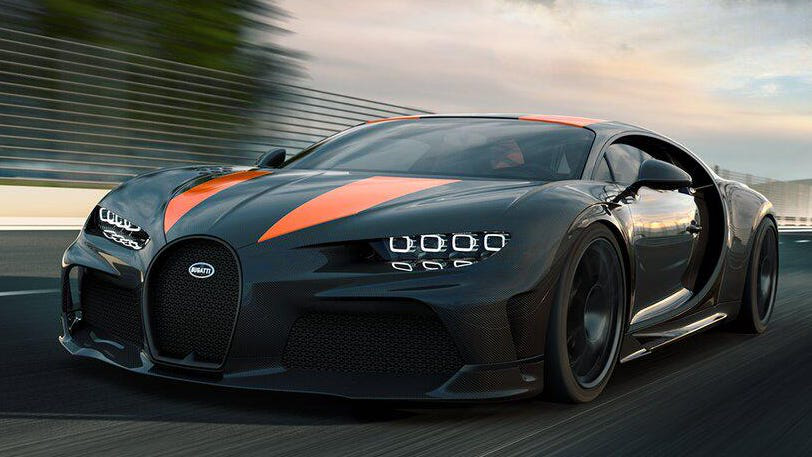

In [1]:
#open directly from source of Github
import io
import requests
from PIL import Image
r = requests.get('https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/testimage.jpg?raw=true', stream=True)
img = Image.open(io.BytesIO(r.content))
img.show()

Image details

In [2]:
img.format

'JPEG'

In [3]:
img.mode

'RGB'

In [4]:
img.size

(812, 457)

In [5]:
img.format_description

'JPEG (ISO 10918)'

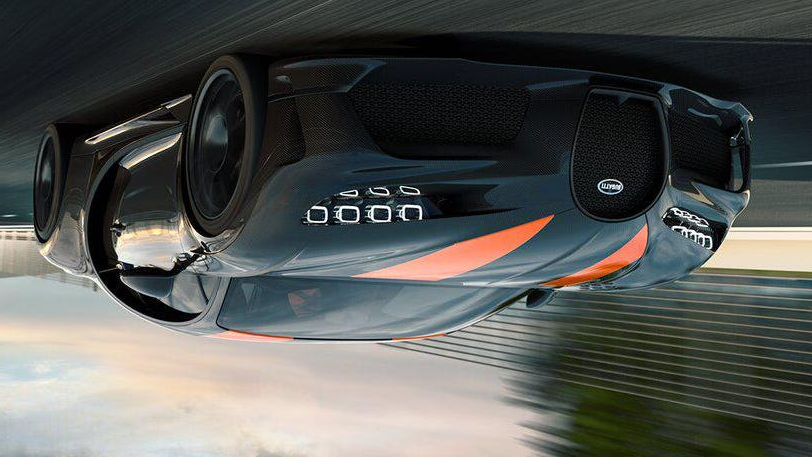

In [6]:
#Rotation and resize
img_out=img.rotate(180)
img_out

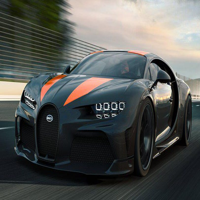

In [7]:
resized_img=img.resize((200,200))
resized_img

In [8]:
#Crop function

width_img=img.width
width_img

812

In [9]:
height_img=img.height
height_img

457

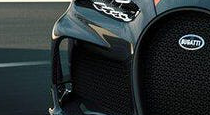

In [10]:
left=10
right=220

top=height_img/2
bottom=3*height_img/4
cropped_img=img.crop((left, top, right, bottom))
cropped_img

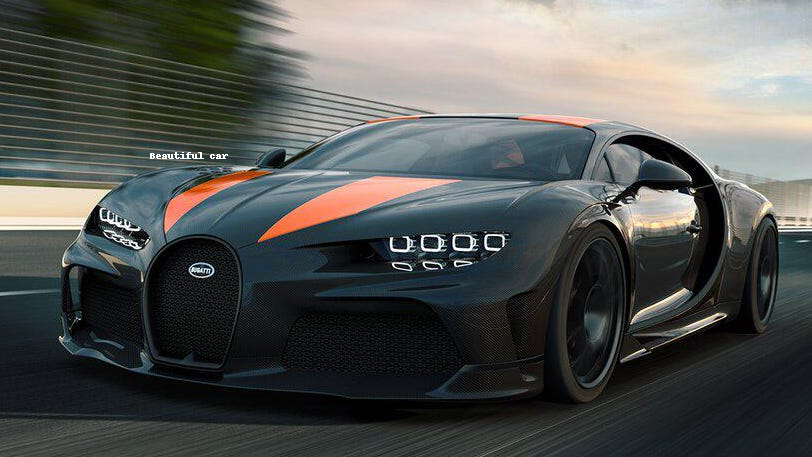

In [11]:
#add text into image
from PIL import ImageDraw
draw=ImageDraw.Draw(img)

draw.text((150,150),"Beautiful car",(255,255,255))
img


In [12]:
#padding
right=98
left =105
top=100
bottom=100

In [13]:
width,height=img.size

In [14]:
width

812

In [15]:
height

457

In [16]:
new_width=width+right+left
new_height=height+top+bottom

In [17]:
result=Image.new(img.mode,(new_width, new_height),(0,255,255))

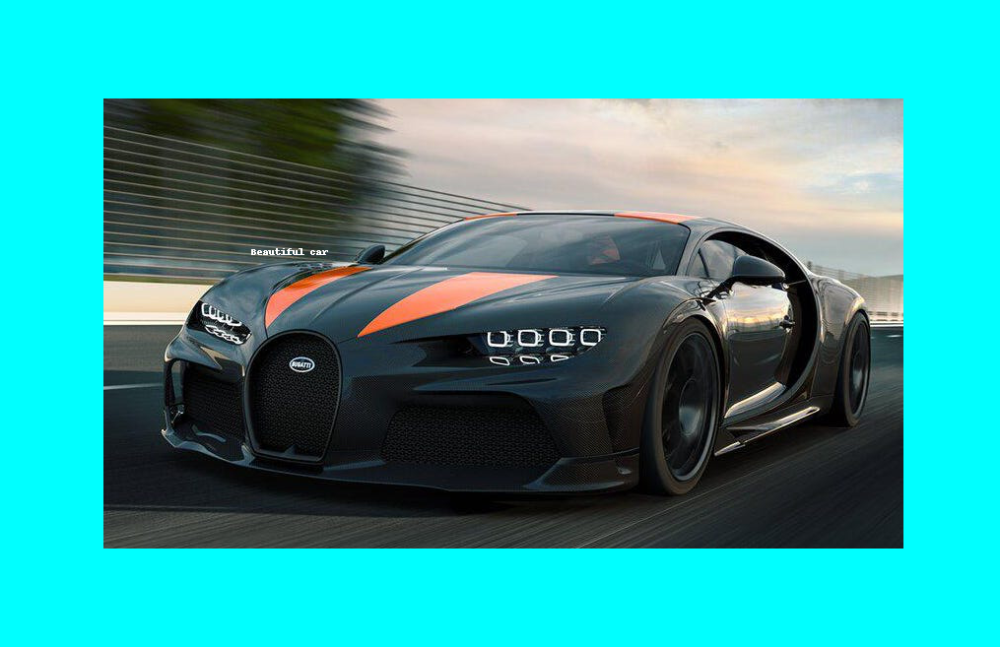

In [18]:
result.paste(img,(left,top))
result

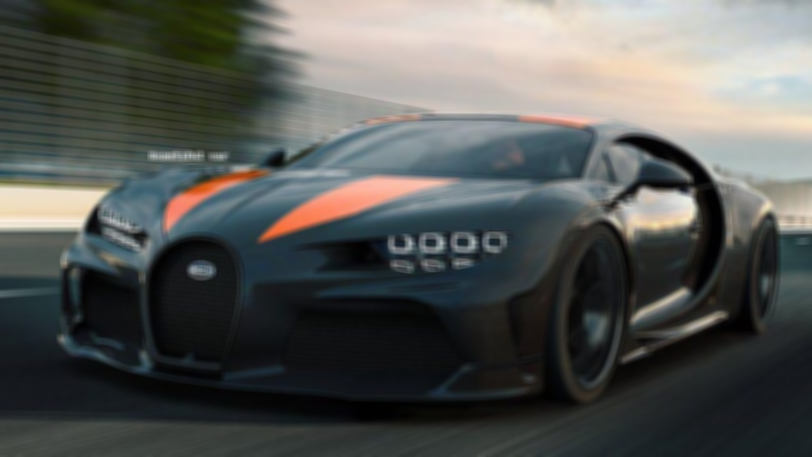

In [19]:
#blur
from PIL import Image, ImageFilter

img1=img.filter(ImageFilter.BoxBlur(3))
img1

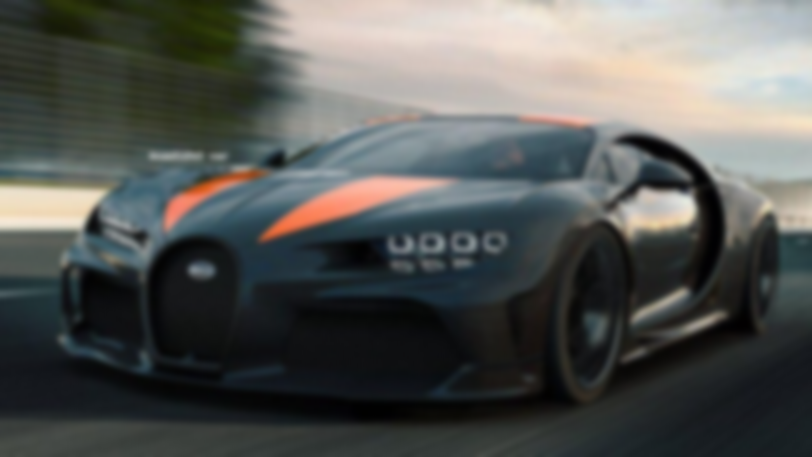

In [20]:
img2=img.filter(ImageFilter.GaussianBlur(3))
img2

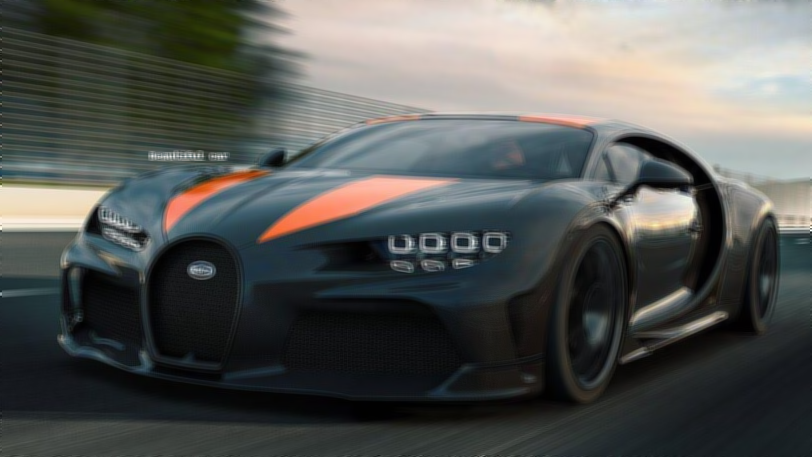

In [21]:
img3=img.filter(ImageFilter.BLUR)
img3

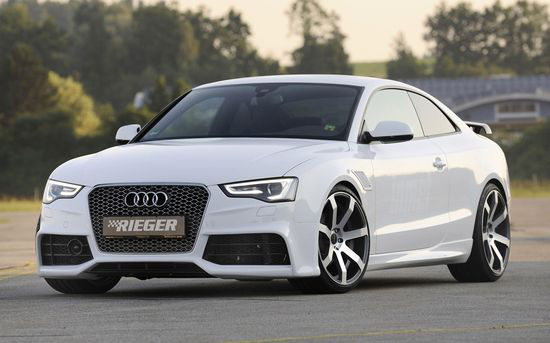

In [22]:
#Concatnate images
r = requests.get('https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/testimage2.jpg?raw=true', stream=True)
img2 = Image.open(io.BytesIO(r.content))
img2.show()

In [23]:
img2.size

(550, 343)

In [24]:
img_size=img.resize((300,100))
img2_size=img2.resize((300,100))

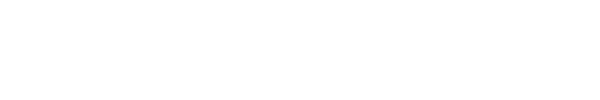

In [25]:
img3=Image.new("RGB",(600,100),"white")
img3

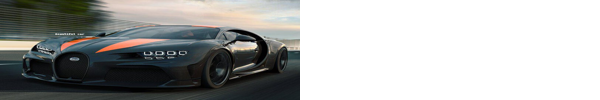

In [26]:
img3.paste(img_size,(0,0))
img3

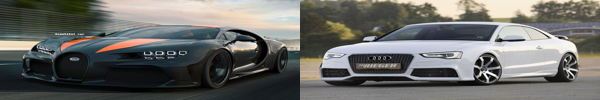

In [27]:
img3.paste(img2_size,(300,0))
img3

In [28]:
#Save
img3.save("concante.jpg")

### <a name='1'></a> OpenCV

In [29]:
import matplotlib.pyplot as plt
import cv2
import io
import numpy as np

In [30]:
import cv2
from google.colab.patches import cv2_imshow
from urllib.request import urlopen

image_url = "https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/testimage.jpg?raw=true"
resp = urlopen(image_url)
image = np.asarray(bytearray(resp.read()), dtype="uint8")
image

array([255, 216, 255, ...,  63, 255, 217], dtype=uint8)

In [31]:
type(image)

numpy.ndarray

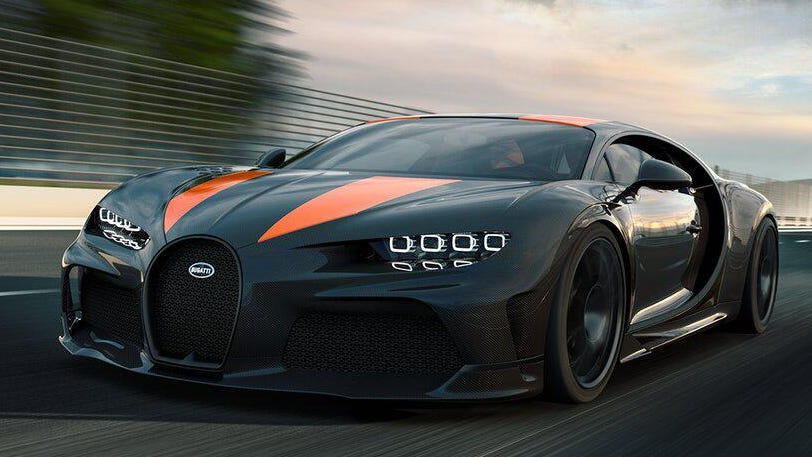

In [32]:
image = cv2.imdecode(image, cv2.IMREAD_COLOR) # The image object

# Optional: For testing & viewing the image
cv2_imshow(image)

In [33]:
# open file from path
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height,width = im_data.shape[:2]

    figsize = width / float(dpi), height / float(dpi)

    fig = plt.figure(figsize=figsize)

    ax = fig.add_axes([0,0,1,1])

    ax.axis('off')

    ax.imshow(im_data,cmap='gray')

    plt.show()

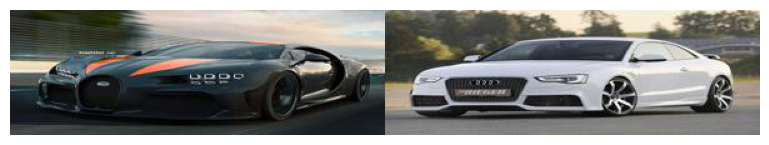

In [34]:
display("/content/concante.jpg")

<ipython-input-35-06c530716be4>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imread(url)


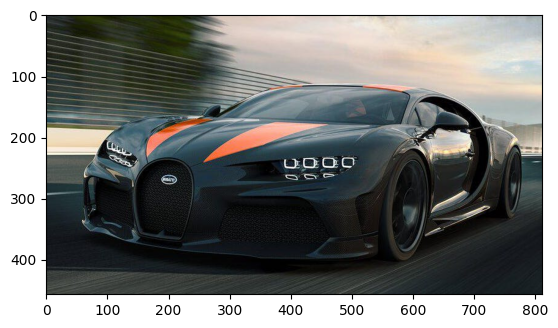

In [35]:
#open file from url
import matplotlib.pyplot as plt
from imageio import imread

url = "https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/testimage.jpg?raw=true"
img = imread(url)
plt.imshow(img)

In [36]:
#Invert an Image
inverted_image=cv2.bitwise_not(img)
inverted_image

array([[[211, 205, 207],
        [211, 205, 207],
        [209, 203, 205],
        ...,
        [105,  97,  94],
        [103,  95,  92],
        [101,  93,  90]],

       [[214, 208, 210],
        [216, 210, 212],
        [218, 212, 214],
        ...,
        [101,  93,  90],
        [100,  92,  89],
        [ 98,  90,  87]],

       [[207, 201, 201],
        [208, 202, 202],
        [211, 205, 205],
        ...,
        [ 94,  86,  83],
        [ 92,  84,  81],
        [ 90,  82,  79]],

       ...,

       [[189, 184, 190],
        [187, 182, 188],
        [184, 179, 185],
        ...,
        [230, 222, 219],
        [230, 222, 219],
        [230, 222, 219]],

       [[180, 175, 181],
        [184, 179, 185],
        [187, 182, 188],
        ...,
        [232, 224, 221],
        [232, 224, 221],
        [231, 223, 220]],

       [[177, 172, 178],
        [178, 173, 179],
        [176, 171, 177],
        ...,
        [231, 223, 220],
        [231, 223, 220],
        [231, 223, 220]]

In [37]:
cv2.imwrite("inverted_img.jpg",inverted_image)

True

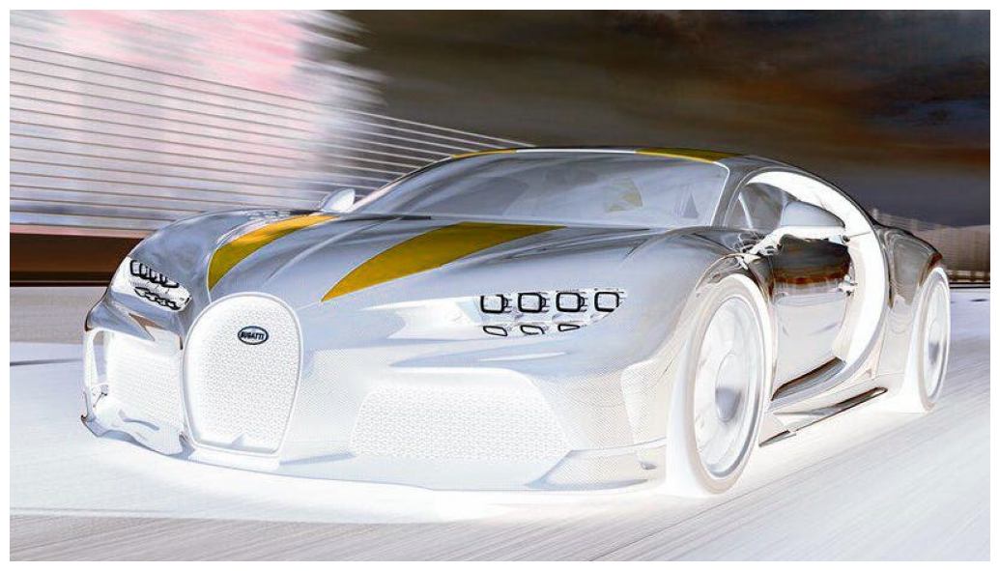

In [38]:
display("/content/inverted_img.jpg")

In [39]:
# Binarization
def grayscale(image):
  return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [40]:
gray_image=grayscale(img)

In [41]:
cv2.imwrite("gray_image.jpg", gray_image)

True

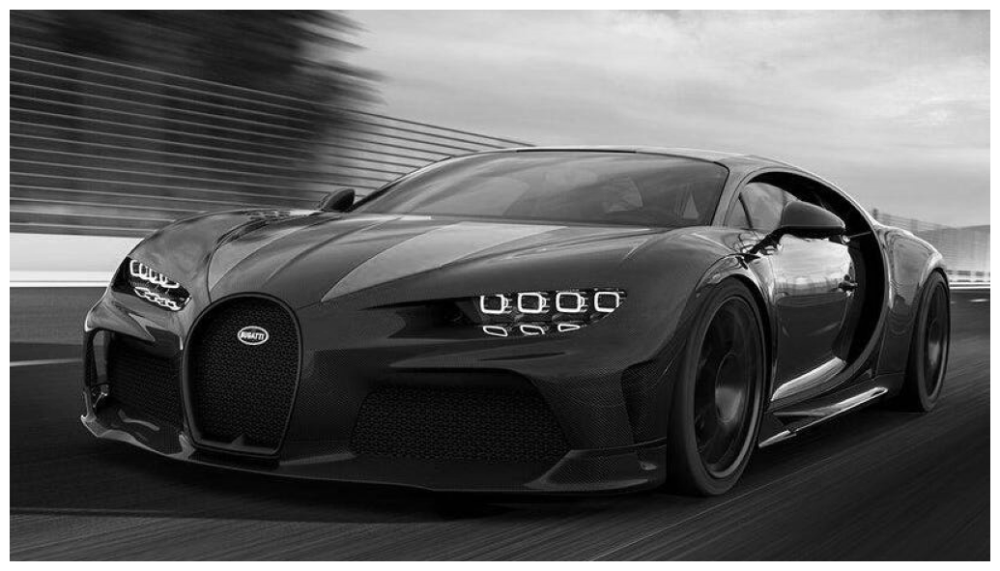

In [42]:
display("/content/gray_image.jpg")

In [43]:
tresh, im_bw=cv2.threshold(gray_image, 210,230,cv2.THRESH_BINARY)

In [44]:
cv2.imwrite("binarized_image.jpg", im_bw)

True

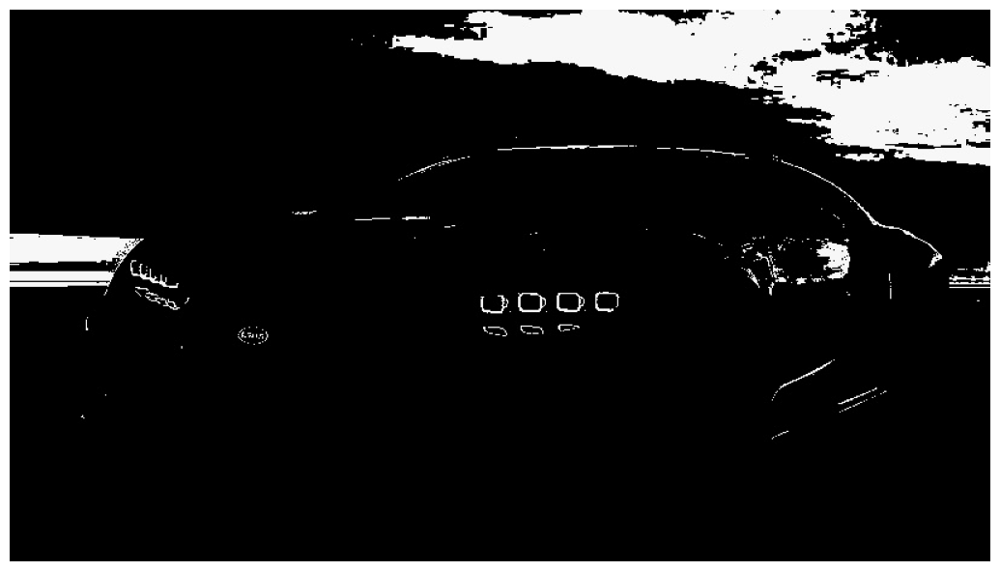

In [45]:
display("/content/binarized_image.jpg")

In [46]:
#Erosion and dilation

def thin_font(image):
  image=cv2.bitwise_not(image)
  kernel=np.ones((2,2),np.uint8)
  image=cv2.erode(image,kernel,iterations=1)
  image=cv2.bitwise_not(image)
  return image


In [47]:
erode_image=thin_font(img)
cv2.imwrite("eroded_image.jpg",erode_image)

True

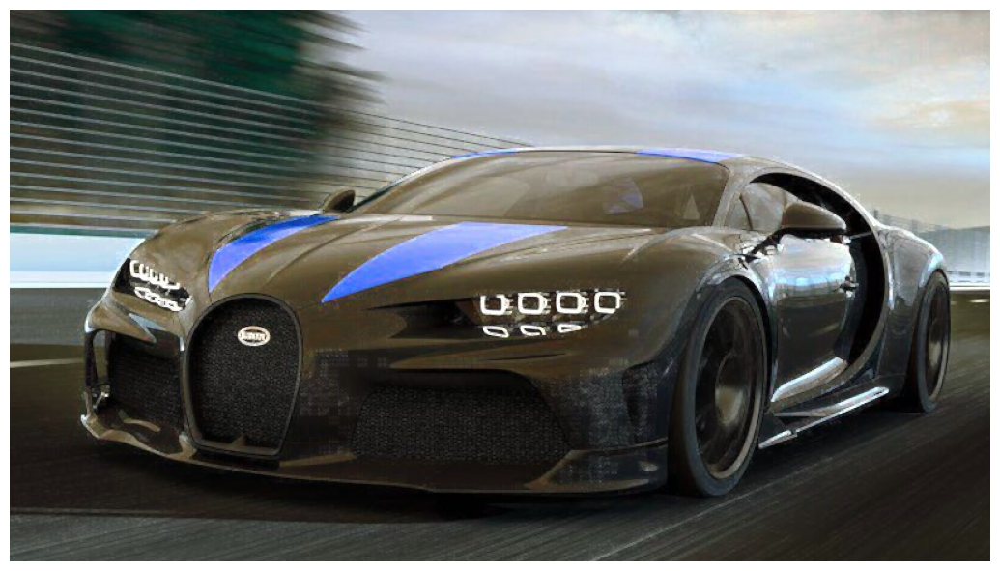

In [48]:
display("/content/eroded_image.jpg")

In [49]:
def thick_font(image):
  image=cv2.bitwise_not(image)
  kernel=np.ones((2,2),np.uint8)
  image=cv2.dilate(image,kernel,iterations=1)
  image=cv2.bitwise_not(image)
  return image

In [50]:
dilated_img=thick_font(img)
cv2.imwrite("dilated_img.jpg",dilated_img)

True

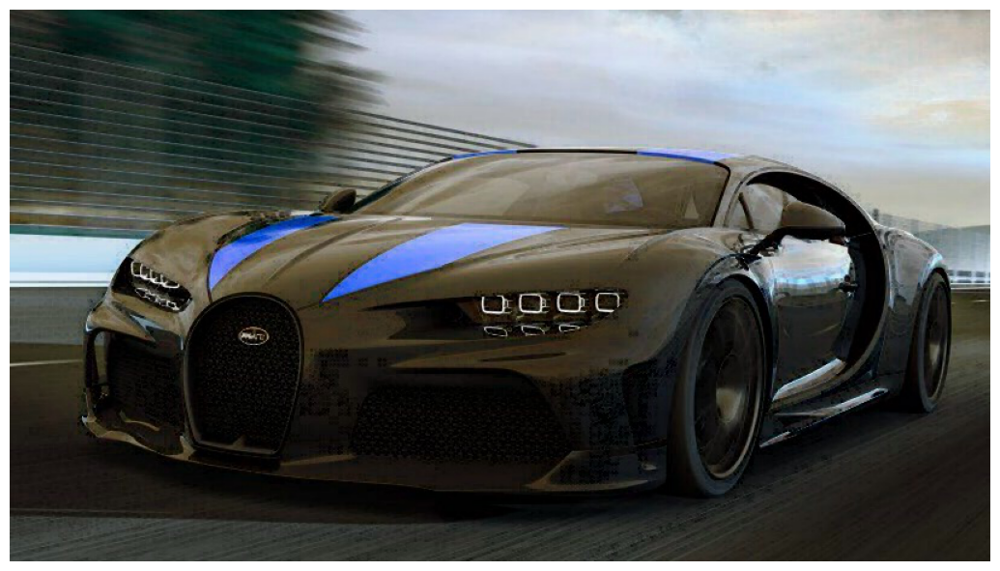

In [51]:
display("/content/dilated_img.jpg")

### <a name='2'></a> Pytesseract

In [52]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 15 not upgraded.
Need to get 4,850 kB of archives.
After this operation, 16.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1 [1,598 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr amd64 4.1.1-2build2 [262 kB]
Fetched 4,850 kB in 1s (4,845 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/Fro

In [53]:
import pytesseract
from PIL import Image

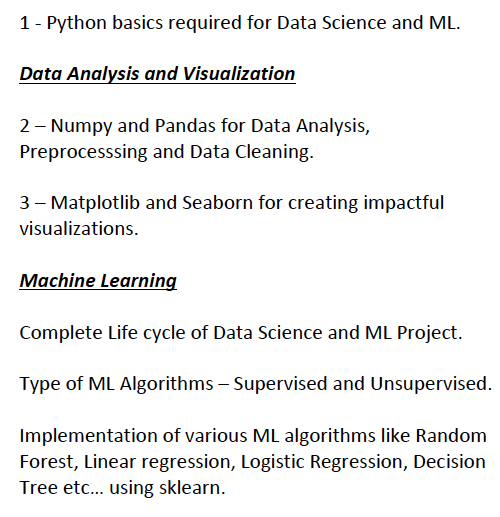

In [54]:
import io
import requests
from PIL import Image
r = requests.get('https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/Text.png?raw=true', stream=True)
img4 = Image.open(io.BytesIO(r.content))
img4.show()

In [55]:
#Convert image to numpy array
np_img = np.array(img4)

cv2.imwrite("text_img.jpg",np_img)

True

In [56]:
#Image to Text
text=pytesseract.image_to_string("/content/text_img.jpg")
print(text)

1 - Python basics required for Data Science and ML.

Data Analysis and Visualization

2—Numpy and Pandas for Data Analysis,
Preprocesssing and Data Cleaning.

3 —Matplotlib and Seaborn for creating impactful
visualizations.

Machine Learning

Complete Life cycle of Data Science and ML Project.
Type of ML Algorithms — Supervised and Unsupervised.
Implementation of various ML algorithms like Random

Forest, Linear regression, Logistic Regression, Decision
Tree etc... using sklearn.



In [57]:
#image from url
text=pytesseract.image_to_string(img4)
print(text)

1 - Python basics required for Data Science and ML.

Data Analysis and Visualization

2—Numpy and Pandas for Data Analysis,
Preprocesssing and Data Cleaning.

3 —Matplotlib and Seaborn for creating impactful
visualizations.

Machine Learning

Complete Life cycle of Data Science and ML Project.
Type of ML Algorithms — Supervised and Unsupervised.
Implementation of various ML algorithms like Random

Forest, Linear regression, Logistic Regression, Decision
Tree etc... using sklearn.



In [58]:
#Get Bounding Boxes for Text
print(pytesseract.image_to_boxes(img4))

1 21 488 29 501 0
- 35 492 41 493 0
P 48 484 59 502 0
y 48 484 66 501 0
t 67 488 73 501 0
h 75 488 84 502 0
o 75 484 93 502 0
n 85 488 106 498 0
b 113 488 119 502 0
a 113 488 123 502 0
s 124 488 132 498 0
i 133 488 141 498 0
c 142 488 145 502 0
s 146 488 163 498 0
r 169 488 175 498 0
e 176 488 185 498 0
q 186 484 196 498 0
u 188 484 206 502 0
i 198 488 207 498 0
r 209 488 220 502 0
e 221 488 230 498 0
d 231 488 241 502 0
f 247 488 254 502 0
o 254 488 264 498 0
r 266 488 272 498 0
D 278 488 289 501 0
a 291 488 299 498 0
t 300 488 307 501 0
a 308 488 316 498 0
S 322 488 331 501 0
c 332 488 340 498 0
i 342 488 344 502 0
e 346 488 355 498 0
n 357 488 366 498 0
c 368 488 376 498 0
e 377 488 386 498 0
a 392 488 401 498 0
n 403 488 412 498 0
d 413 488 423 502 0
M 430 488 445 501 0
L 435 488 453 501 0
. 448 488 460 501 0
D 20 437 30 450 0
a 20 437 43 450 0
t 30 437 49 450 0
a 44 437 62 449 0
A 66 433 77 451 0
n 66 437 79 450 0
a 80 437 91 447 0
l 91 437 102 447 0
y 102 437 108 451 0
s 108 433 

In [59]:
#Getting Boxes around Text
from pytesseract import Output

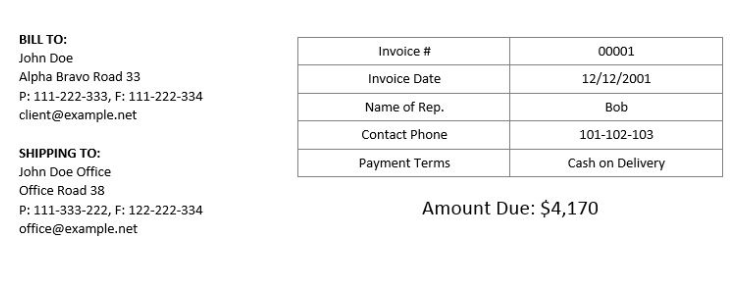

In [60]:
import io
import requests
from PIL import Image
r = requests.get('https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/Text2.PNG?raw=true', stream=True)
img5 = Image.open(io.BytesIO(r.content))
img5.show()

In [61]:
data=pytesseract.image_to_data(img5, output_type=Output.DICT)
data.keys()

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])

In [62]:
#Convert image to numpy array
np_img1 = np.array(img5)

cv2.imwrite("data_text_img.jpg",np_img1)

True

In [63]:
img6=cv2.imread("/content/data_text_img.jpg")

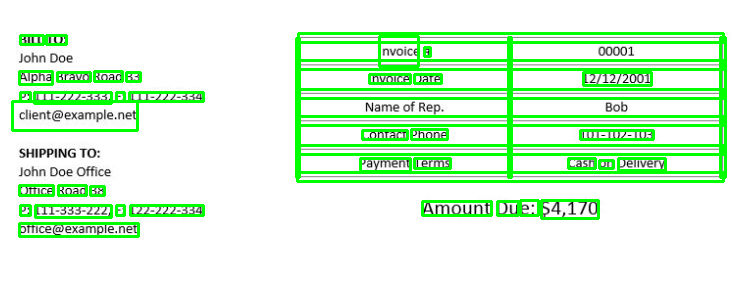

-1

In [64]:
from google.colab.patches import cv2_imshow

n_boxes=len(data["text"])
for i in range(n_boxes):
  if int(data['conf'][i])>60:
    (x,y,w,h)=(data['left'][i], data['top'][i],data['width'][i],data['height'][i])
    img7=cv2.rectangle(img6, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(img7)
cv2.waitKey(0)

In [65]:
#Text template matching
data=pytesseract.image_to_data(img5, output_type=Output.DICT)
keys=list(data.keys())
keys

['level',
 'page_num',
 'block_num',
 'par_num',
 'line_num',
 'word_num',
 'left',
 'top',
 'width',
 'height',
 'conf',
 'text']

In [66]:
data_pattern='^(0[1-9]|[12][0-9]|3[01])/(0[1-9]|1[012])/(19|20)\d\d$'

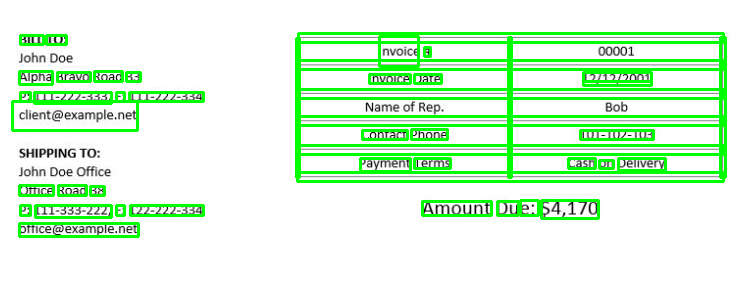

-1

In [67]:
import re
from pytesseract import Output
n_boxes=len(data['text'])
for i in range(n_boxes):
  if int(data['conf'][i])>60:
    if re.match(data_pattern,data['text'][i]):
      (x,y,w,h)=(data['left'][i],data['top'][i],data['width'][i], data['height'][i])
      img8=cv2.rectangle(img6,(x,y),(x+w,w+h),(0,255,0),2)
cv2_imshow(img8)
cv2.waitKey(0)

In [68]:
#Plate license
import cv2
import imutils


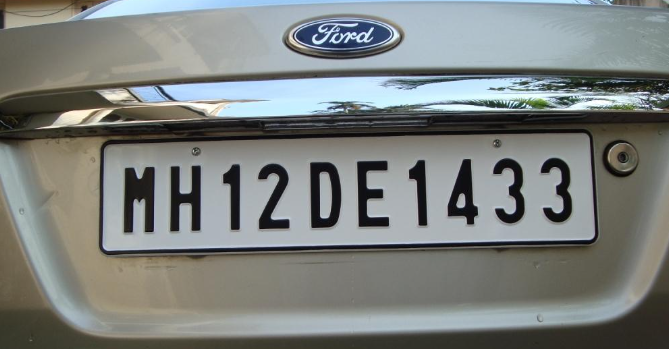

In [69]:
import io
import requests
from PIL import Image
r = requests.get('https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/Plate_license.PNG?raw=true', stream=True)
img9 = Image.open(io.BytesIO(r.content))
img9.show()

In [70]:
#Convert image to numpy array
np_img1 = np.array(img9)

cv2.imwrite("plate license.jpg",np_img1)

True

In [71]:
img9=cv2.imread("/content/plate license.jpg")

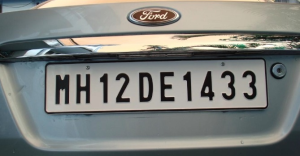

In [72]:
img9=imutils.resize(img9, width=300)
cv2_imshow(img9)

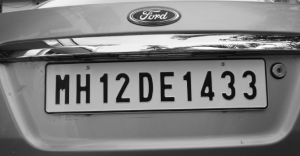

In [73]:
gray_img=cv2.cvtColor(img9, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)

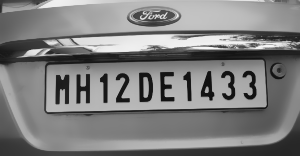

In [74]:
smoothened_gray_img=cv2.bilateralFilter(gray_img, 10,16,16)
cv2_imshow(smoothened_gray_img)

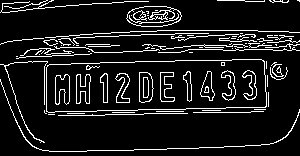

In [75]:
edged_img=cv2.Canny(smoothened_gray_img, 30,200)
cv2_imshow(edged_img)

In [76]:
cnts, new = cv2.findContours(edged_img.copy(),cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
image1 = img9.copy()
cv2.drawContours(image1,cnts,-1,(0,255,0),3)

array([[[ 74,  54,  35],
        [ 73,  52,  31],
        [ 76,  52,  32],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[ 69,  51,  28],
        [ 71,  49,  26],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[ 72,  54,  32],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       ...,

       [[ 56,  56,  42],
        [ 56,  56,  42],
        [ 56,  56,  42],
        ...,
        [ 44,  41,  36],
        [ 44,  41,  36],
        [ 44,  41,  36]],

       [[ 55,  56,  43],
        [ 55,  56,  43],
        [ 56,  56,  43],
        ...,
        [ 43,  40,  35],
        [ 44,  41,  36],
        [ 44,  41,  36]],

       [[ 54,  56,  44],
        [ 55,  57,  45],
        [ 54,  56,  44],
        ...,
        [ 44,  41,  36],
        [ 44,  41,  36],
        [ 44,  41,  36]]

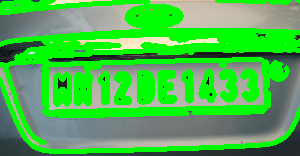

In [77]:
cv2_imshow(image1 )

In [78]:
cnts = sorted(cnts, key = cv2.contourArea, reverse = True) [:30]
screenCnt = None
image2 = img9.copy()
cv2.drawContours(image2,cnts,-1,(0,255,0),3)

array([[[ 74,  54,  35],
        [ 73,  52,  31],
        [ 76,  52,  32],
        ...,
        [110, 118, 111],
        [141, 153, 147],
        [162, 176, 170]],

       [[ 69,  51,  28],
        [ 71,  49,  26],
        [ 79,  55,  31],
        ...,
        [101, 102,  96],
        [104, 111, 104],
        [127, 138, 130]],

       [[ 72,  54,  32],
        [ 73,  53,  30],
        [ 86,  64,  38],
        ...,
        [107, 105, 102],
        [101, 102,  98],
        [ 81,  85,  80]],

       ...,

       [[ 56,  56,  42],
        [ 56,  56,  42],
        [ 56,  56,  42],
        ...,
        [ 44,  41,  36],
        [ 44,  41,  36],
        [ 44,  41,  36]],

       [[ 55,  56,  43],
        [ 55,  56,  43],
        [ 56,  56,  43],
        ...,
        [ 43,  40,  35],
        [ 44,  41,  36],
        [ 44,  41,  36]],

       [[ 54,  56,  44],
        [ 55,  57,  45],
        [ 54,  56,  44],
        ...,
        [ 44,  41,  36],
        [ 44,  41,  36],
        [ 44,  41,  36]]

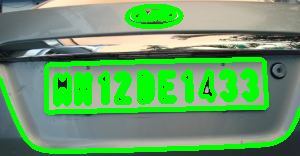

In [79]:
cv2_imshow(image2)

In [80]:
i = 7
for c in cnts:
    perimeter = cv2.arcLength(c,True)
    approx = cv2.approxPolyDP(c,0.018 * perimeter, True)
    if len(approx) == 4:
        screenCnt = approx
        x,y,w,h = cv2.boundingRect(c)
        new_img = img9[y:y+h,x:x+w]
        cv2.imwrite('./'+str(i)+'.png',new_img)
        i+=1
        break

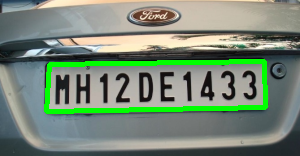

In [81]:
cv2.drawContours(img9,[screenCnt],-1,(0,255,0),3)
cv2_imshow(img9)

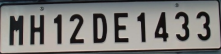

In [82]:
Cropped_loc = './7.png'
cv2_imshow(cv2.imread(Cropped_loc))


In [83]:
plate = pytesseract.image_to_string(Cropped_loc,lang='eng')
print("Number plate is:",plate)
cv2.waitKey(0)
cv2.destroyAllWindows()

Number plate is: MH12DE1433



### <a name='3'></a> Machine Learning

In [84]:
import numpy as np
import cv2


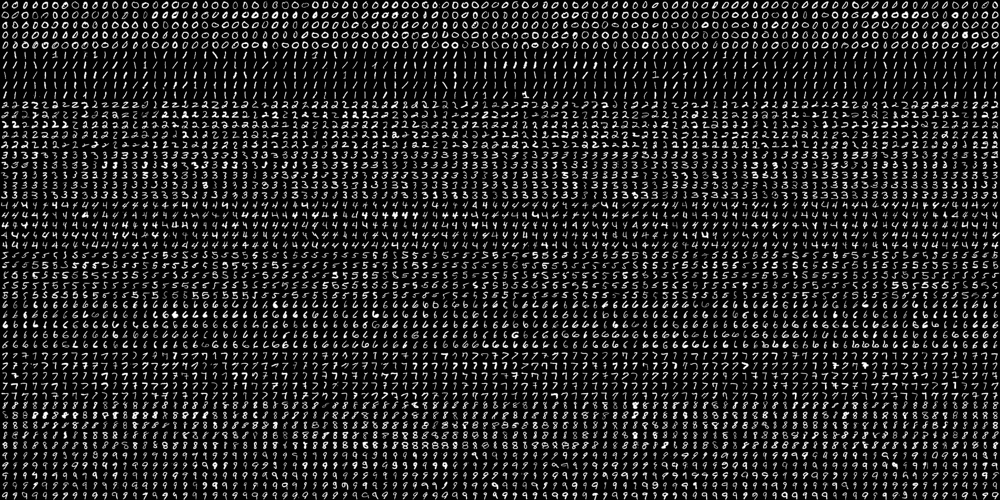

-1

In [85]:
import urllib.request
url_response = urllib.request.urlopen('https://github.com/proteus21/COMPUTER-VISION/blob/main/2_OCR_Methods/Source/digits1.png?raw=true')
img_array = np.array(bytearray(url_response.read()), dtype=np.uint8)
img = cv2.imdecode(img_array, -1)
cv2_imshow(img)
cv2.waitKey()

In [86]:
cv2.imwrite('digits.jpg',img)

True

In [87]:
img=cv2.imread('/content/digits.jpg')

In [91]:
gray_img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
divisions=list(np.hsplit(i,100) for i in np.vsplit(gray_img,50))
NP_array=np.array(divisions)
train_data=NP_array[:,:50].reshape(-1,400).astype(np.float32)
train_data

array([[0., 0., 3., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 2., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 1.],
       [1., 0., 2., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 1.]], dtype=float32)

In [93]:
test_data=NP_array[:,50:100].reshape(-1,400).astype(np.float32)
test_data

array([[0., 3., 0., ..., 0., 0., 0.],
       [2., 2., 0., ..., 0., 0., 2.],
       [3., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 2., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 2.]], dtype=float32)

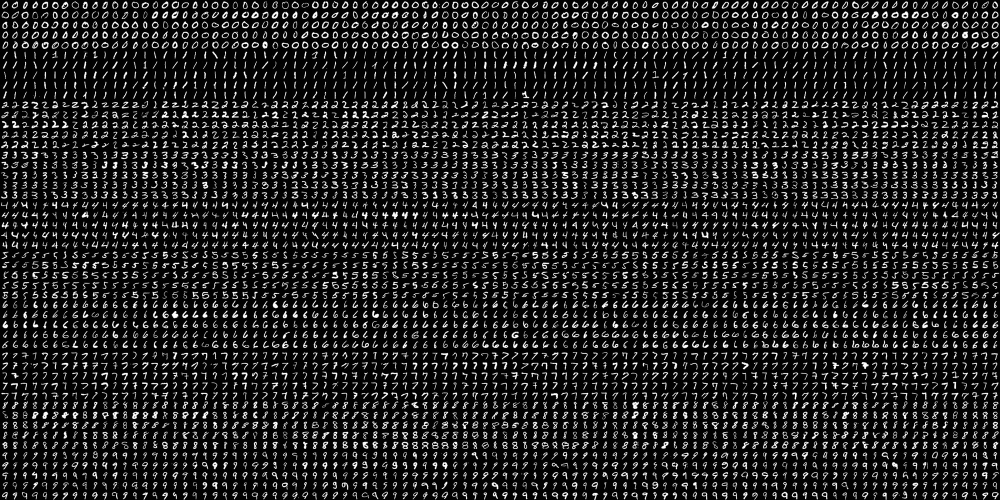

In [94]:
from PIL import Image
img=Image.open('/content/digits.jpg')
img

In [95]:
k=np.arange(10) # we have numbers from 0 to 9
k

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [97]:
train_labels=np.repeat(k,250)[:,np.newaxis] # np.newaxis change from horizontal to vertical
train_labels

array([[0],
       [0],
       [0],
       ...,
       [9],
       [9],
       [9]])

In [98]:
test_labels=np.repeat(k,250)[:,np.newaxis] # np.newaxis change from horizontal to vertical
test_labels

array([[0],
       [0],
       [0],
       ...,
       [9],
       [9],
       [9]])

In [99]:
knn=cv2.ml.KNearest_create()
knn

< cv2.ml.KNearest 0x7f075e3b6870>

In [100]:
knn.train(train_data,cv2.ml.ROW_SAMPLE, train_labels)

True

In [101]:
ret, output, neighbours, distance=knn.findNearest(test_data, k=3)

In [104]:
matched=output==test_labels
correct_OP=np.count_nonzero(matched)

In [105]:
accurancy=(correct_OP*100)/(output.size)
accurancy

96.84